In [ ]:
# Map Visualizations
*Vignesh Sivan*

This jupyter notebook has various map-related visualizations. Showing how concentrations change over time through interactive plotting was useful in showing that MC concentrations are generally greater in fall time (August-ish)

Analysis was completed using Python via Jupyter Notebook; specific libraries include:
- Pandas
- Plotly
- Scipy
- Pickle

In [ ]:
# All import statements here!
import pandas as pd
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
import numpy as np
from IPython.display import HTML
from IPython.display import display, clear_output, Image
from ipywidgets import widgets
plotly.offline.init_notebook_mode()

In [2]:
alberta = pd.read_pickle("../data/alberta.pkl")
florida = pd.read_pickle("../data/florida.pkl")
df = pd.concat([alberta, florida], sort=False).reset_index(drop=True)
#df.head()
#florida.head()
#alberta
df.head()

,LAT,LONG,Secchi Depth (m),Microcystin (ug/L),Total Phosphorus (ug/L),Total Nitrogen (ug/L),Total Chlorophyll (ug/L),Body of Water,Temperature (degrees celsius),Body of Water Name,DATETIME,Altitude
0,53.61544,-112.92044,1.35,0.09,256.0,5668.0,13.1,Lake,21.6,ADAMSON LAKE,2008-06-25 14:00:00,729.063
1,53.61544,-112.92044,1.20,0.07,161.0,6322.0,11.0,Lake,22.4,ADAMSON LAKE,2008-07-24 12:50:00,729.063
2,53.61544,-112.92044,0.40,0.08,497.0,6065.0,107.0,Lake,17.47,ADAMSON LAKE,2008-08-13 11:45:00,729.063
3,53.61544,-112.92044,0.22,0.10,614.0,8055.0,169.0,Lake,13.22,ADAMSON LAKE,2008-09-09 10:45:00,729.063
4,53.61544,-112.92044,0.30,0.07,578.0,8668.0,168.0,Lake,8.54,ADAMSON LAKE,2008-10-07 11:30:00,729.063


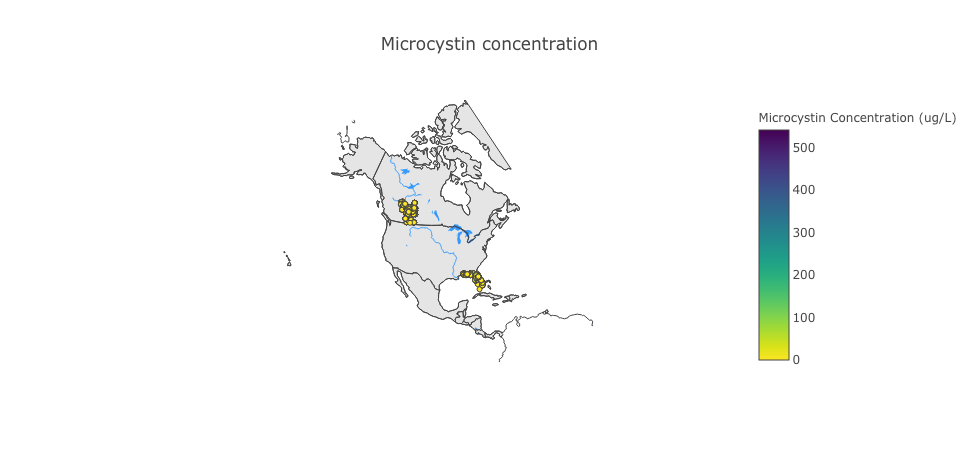

In [3]:
layout = go.Layout(title='Microcystin concentration',
                   showlegend=False,
                       geo = dict(
                            scope='north america',
                            showframe = False,
                            showcoastlines = True,
                            showlakes = True,
                            showland = True,
                            landcolor = "rgb(229, 229, 229)",
                            showrivers = True
                        ))

data = [ dict(
        type = 'scattergeo',
        lon = df['LONG'],
        lat = df['LAT'],
        mode = 'markers',
        text = df['Microcystin (ug/L)'],
        marker = dict(
            size = 5,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis' ,
            cmin = 0,
            color = df['Microcystin (ug/L)'],
            cmax = df['Microcystin (ug/L)'].max(),
            colorbar=dict(
                title="Microcystin Concentration (ug/L)"
            )
        ))]

fig = go.Figure(layout=layout, data=data)

plotly.offline.iplot(fig, validate=False)

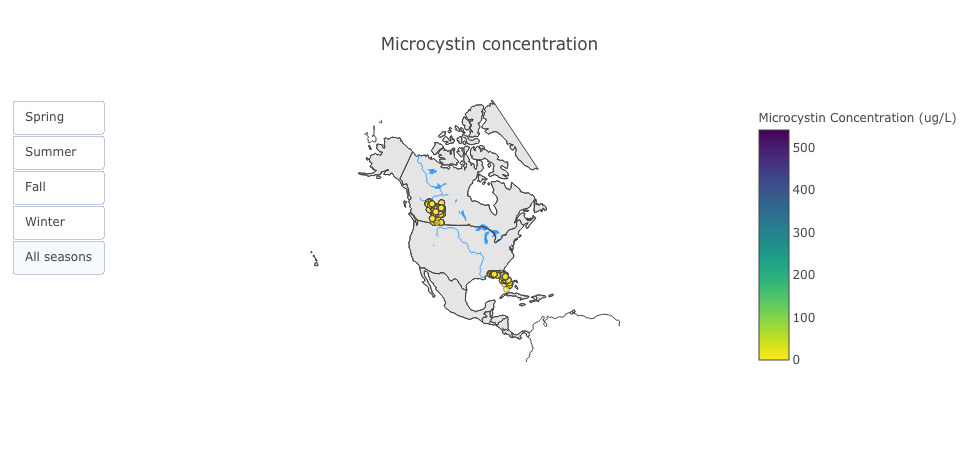

In [6]:
# Segment data sets based on season (to show impact of season on MC concentration)

month = pd.to_datetime(df['DATETIME']).dt.month
spring = df[(month >= 3) & (month <= 5)]
summer = df[(month >= 6) & (month <= 8)]
fall = df[(month >= 9) & (month <=11)]
winter = df[(month == 12) | (month <= 2)]

summer_dat =  dict(
        type = 'scattergeo',
        lon = summer['LONG'],
        lat = summer['LAT'],
        mode = 'markers',
        text = summer['Microcystin (ug/L)'],
        name = "summer",
        visible = False,
        marker = dict(
            size = 5,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis' ,
            cmin = 0,
            color = summer['Microcystin (ug/L)'],
            cmax = summer['Microcystin (ug/L)'].max(),
            colorbar=dict(
                title="Microcystin Concentration (ug/L)"
            )
        ))

spring_dat =  dict(
        type = 'scattergeo',
        lon = spring['LONG'],
        lat = spring['LAT'],
        mode = 'markers',
        text = spring['Microcystin (ug/L)'],
        name = "spring",
        visible = False,
        marker = dict(
            size = 5,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis' ,
            cmin = 0,
            color = spring['Microcystin (ug/L)'],
            cmax = spring['Microcystin (ug/L)'].max(),
            colorbar=dict(
                title="Microcystin Concentration (ug/L)"
            )
        ))

fall_dat =  dict(
        type = 'scattergeo',
        lon = fall['LONG'],
        lat = fall['LAT'],
        mode = 'markers',
        text = fall['Microcystin (ug/L)'],
        name = "fall",
        visible = False,
        marker = dict(
            size = 5,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis' ,
            cmin = 0,
            color = fall['Microcystin (ug/L)'],
            cmax = fall['Microcystin (ug/L)'].max(),
            colorbar=dict(
                title="Microcystin Concentration (ug/L)"
            )
        ))

winter_dat =  dict(
        type = 'scattergeo',
        lon = winter['LONG'],
        lat = winter['LAT'],
        mode = 'markers',
        text = winter['Microcystin (ug/L)'],
        name = "winter",
        visible = False,
        marker = dict(
            size = 5,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis' ,
            cmin = 0,
            color = winter['Microcystin (ug/L)'],
            cmax = winter['Microcystin (ug/L)'].max(),
            colorbar=dict(
                title="Microcystin Concentration (ug/L)"
            )
        ))

all_seasons = dict(
        type = 'scattergeo',
        lon = df['LONG'],
        lat = df['LAT'],
        mode = 'markers',
        text = df['Microcystin (ug/L)'],
        name = "all_seasons",
        visible = True,
        marker = dict(
            size = 6,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            opacity = 0.6,
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis' ,
            cmin = 0,
            color = df['Microcystin (ug/L)'],
            cmax = df['Microcystin (ug/L)'].max(),
            colorbar=dict(
                title="Microcystin Concentration (ug/L)"
            )
        ))

seasonal_data = [spring_dat, summer_dat, fall_dat, winter_dat, all_seasons]

updatemenus = list([
    dict(type="buttons",
         active=4,
         buttons=[
            dict(label = 'Spring',
                 method = 'update',
                 args = [{'visible': [True, False, False, False, False]},
                         {'title': 'Microcystin Concentration in Spring'}]),
            dict(label = 'Summer',
                 method = 'update',
                 args = [{'visible': [False, True, False, False, False]},
                         {'title': 'Microcystin Concentration in Summer'}]),
            dict(label = 'Fall',
                 method = 'update',
                 args = [{'visible': [False, False, True, False, False]},
                         {'title': 'Microcystin Concentration in Fall'}]),
            dict(label = 'Winter',
                 method = 'update',
                 args = [{'visible': [False, False, False, True, False]},
                         {'title': 'Microcystin Concentration in Winter'}]),
             dict(label = 'All seasons',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, True]},
                         {'title': 'Microcystin Concentration'}])
        ],
    )
])
seasonal_layout = layout
seasonal_layout["updatemenus"]=updatemenus
fig = go.Figure(layout=seasonal_layout, data=seasonal_data)

plotly.offline.iplot(fig, validate=False)

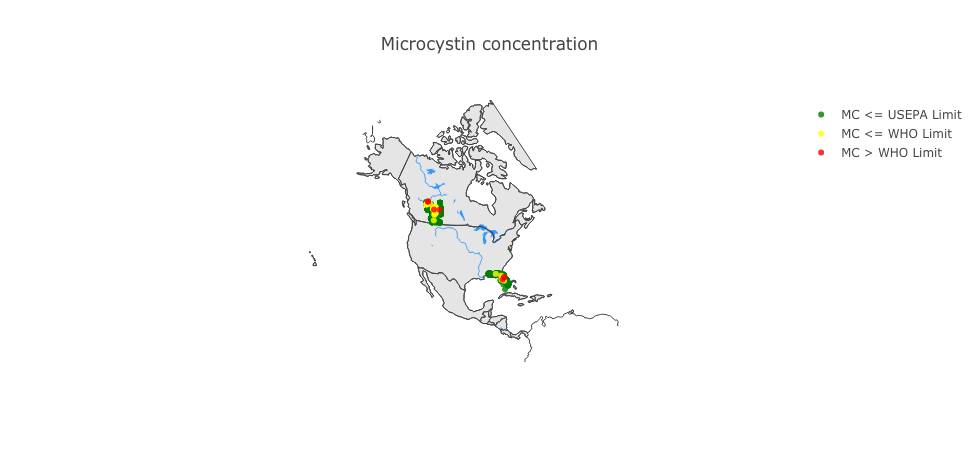

In [5]:
# Create bins based on standards (from literature - refer to the Google Docs for more info)
# Different dataframes are required because plotly seems
# to only show distinctions for different traces??

USEPA_LIMIT = 4
WHO_LIMIT = 20
MC_level = df['Microcystin (ug/L)']
opacity_level = 0.8

bin1 = df[MC_level <= USEPA_LIMIT]
bin2 = df[(MC_level > USEPA_LIMIT) & (MC_level <= WHO_LIMIT)]
bin3 = df[MC_level > WHO_LIMIT]

data_bin1 = go.Scattergeo(
            lon = bin1['LONG'],
            lat = bin1['LAT'],
            mode = 'markers',
            text = bin1['Microcystin (ug/L)'],
            name = "MC <= USEPA Limit",
            marker=dict(color="green",
                opacity = opacity_level))

data_bin2 = go.Scattergeo(
            lon = bin2['LONG'],
            lat = bin2['LAT'],
            mode = 'markers',
            text = bin2['Microcystin (ug/L)'],
            name = "MC <= WHO Limit",
            marker=dict(color="yellow",
                opacity = opacity_level))

data_bin3 = go.Scattergeo(
            lon = bin3['LONG'],
            lat = bin3['LAT'],
            mode = 'markers',
            text = bin3['Microcystin (ug/L)'],
            name = "MC > WHO Limit",
            marker=dict(
                color="red",
                opacity = opacity_level))

binned_data= [data_bin1, data_bin2, data_bin3]
layout = go.Layout(title='Microcystin concentration',
                   showlegend=True,
                       geo = dict(
                            scope='north america',
                            showframe = False,
                            showcoastlines = True,
                            showlakes = True,
                            showland = True,
                            landcolor = "rgb(229, 229, 229)",
                            showrivers = True
                        ))


fig = go.Figure(layout=layout, data=binned_data)
plotly.offline.iplot(fig, validate=False)

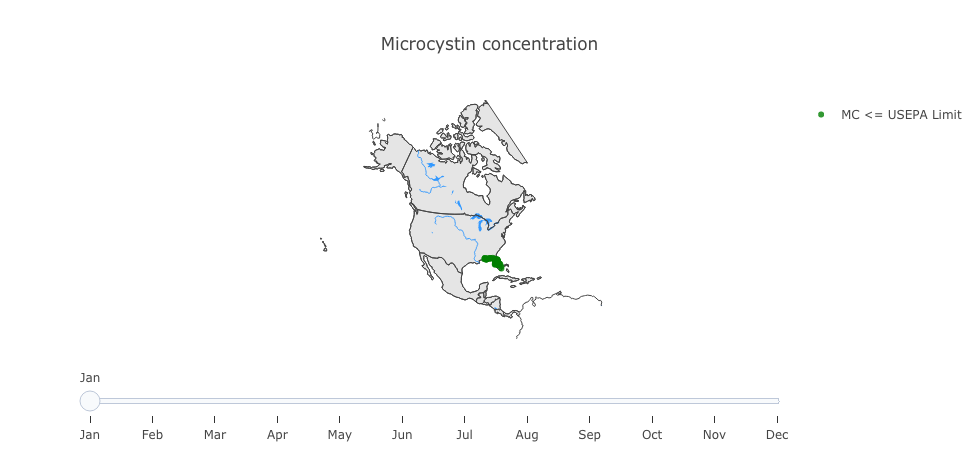

In [6]:
#limits = [0, USEPA_LIMIT, WHO_LIMIT]
month = pd.to_datetime(df['DATETIME']).dt.month

traces = []
for m in range(1,13):
    month_data = df[month == m]
    MC_conc = month_data['Microcystin (ug/L)']
    # make bins
    b1 = month_data[MC_conc <= USEPA_LIMIT]
    b2 = month_data[(MC_conc > USEPA_LIMIT) & (MC_conc <= WHO_LIMIT)]
    b3 = month_data[MC_conc > WHO_LIMIT]
    traces.append(go.Scattergeo(
             lon = b1['LONG'],
             lat = b1['LAT'],
             mode = 'markers',
             text = b1['Microcystin (ug/L)'],
             visible = False,
             name = "MC <= USEPA Limit",
             marker=dict(color="green",opacity = opacity_level)))
    traces.append(go.Scattergeo(
             lon = b2['LONG'],
             lat = b2['LAT'],
             mode = 'markers',
             text = b2['Microcystin (ug/L)'],
             visible = False,
             name = "MC <= WHO Limit",
             marker=dict(color="orange",opacity = opacity_level)))
    traces.append(go.Scattergeo(
             lon = b3['LONG'],
             lat = b3['LAT'],
             mode = 'markers',
             text = b3['Microcystin (ug/L)'],
             visible = False,
             name = "MC > WHO Limit",
             marker=dict(color="red",opacity = opacity_level)))
    
steps = []
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    
for i in range(12):
    step = dict(
    method = 'restyle',  
    args = ['visible', [False] * len(traces)],
    label= months[i])
    
    idx1 = (i+1) * 3 - 3
    idx2 = (i+1) * 3 - 2
    idx3 = (i+1) * 3 - 1
    
    step['args'][1][idx1] = True
    step['args'][1][idx2] = True
    step['args'][1][idx3] = True
    
    steps.append(step)
    
sliders = [dict(
    active = 0,
    steps=steps
)]

# Display all traces pertaining to the month of January
traces[0].visible = True
traces[1].visible = True
traces[2].visible = True

layout = go.Layout(title='Microcystin concentration',
                   showlegend=True,
                   sliders = sliders,
                       geo = dict(
                            scope='north america',
                            showframe = False,
                            showcoastlines = True,
                            showlakes = True,
                            showland = True,
                            landcolor = "rgb(229, 229, 229)",
                            showrivers = True
                        ))

fig = go.Figure(layout=layout, data=traces)    
plotly.offline.iplot(fig, validate=False)

In [14]:
# Observing relative change in MC concentration might also be useful

#df["MC percent change"] = df.sort_values(by="DATETIME").groupby(["LAT", "LONG"], axis=1)["Microcystin (ug/L)"].pct_change()
df["MC Percent Change"] = df.sort_values("DATETIME").\
                            groupby(['LONG','LAT'])["Microcystin (ug/L)"].\
                            apply(lambda x: x.pct_change()).fillna(0)

#df

/Users/vigsivan/Desktop/GLEON-GMA/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



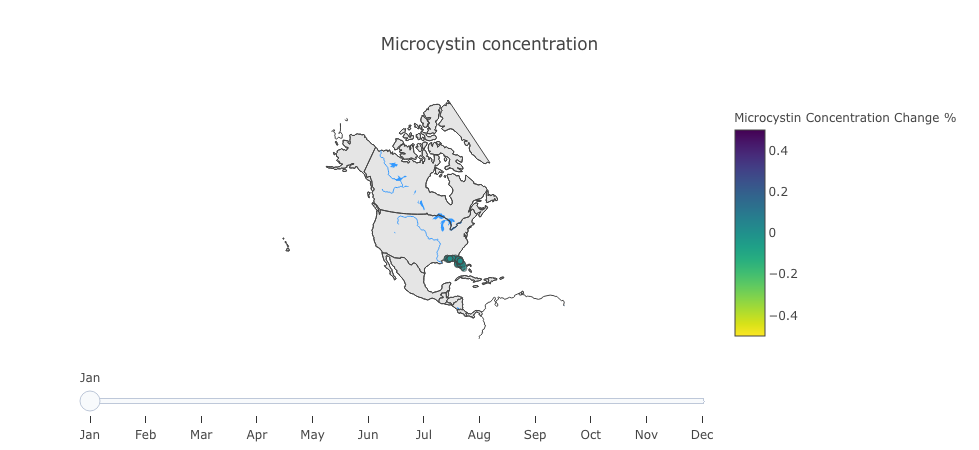

In [15]:
#limits = [0, USEPA_LIMIT, WHO_LIMIT]
month = pd.to_datetime(df['DATETIME']).dt.month
#df["MC_pc_bin"] = np.log(df["MC percent change"])

traces = []
for m in range(1,13):
    month_data = df[month == m]
    month_data["MC_pc_bin"] = month_data["MC Percent Change"]
    traces.append(go.Scattergeo(
             lon = month_data['LONG'],
             lat = month_data['LAT'],
             mode = 'markers',
             text = df['MC Percent Change'],
             visible = False,
             #name = "MC > WHO Limit",
            marker = dict(
                size = 6,
                reversescale = True,
                autocolorscale = False,
                symbol = 'circle',
                opacity = 0.6,
                line = dict(
                    width=1,
                    color='rgba(102, 102, 102)'
                ),
                colorscale = 'Viridis' ,
                cmin = 0,
                color = month_data['MC_pc_bin'],
                cmax = month_data['MC_pc_bin'].max(),
                colorbar=dict(
                    title="Microcystin Concentration Change %")
            )))
    
steps = []
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    
for i in range(12):
    step = dict(
    method = 'restyle',  
    args = ['visible', [False] * len(traces)],
    label= months[i])
    
    step['args'][1][i] = True
    
    steps.append(step)
    
sliders = [dict(
    active = 0,
    steps=steps
)]

# Display all traces pertaining to the month of January
traces[0].visible = True

layout = go.Layout(title='Microcystin concentration',
                   showlegend=False,
                   sliders = sliders,
                       geo = dict(
                            scope='north america',
                            showframe = False,
                            showcoastlines = True,
                            showlakes = True,
                            showland = True,
                            landcolor = "rgb(229, 229, 229)",
                            showrivers = True
                        ))

fig = go.Figure(layout=layout, data=traces)    
plotly.offline.iplot(fig, validate=False)

In [16]:
df.head()

,LAT,LONG,Secchi Depth (m),Microcystin (ug/L),Total Phosphorus (ug/L),Total Nitrogen (ug/L),Total Chlorophyll (ug/L),Body of Water,Temperature (degrees celsius),Body of Water Name,DATETIME,Altitude,MC Percent Change
0,53.61544,-112.92044,1.35,0.09,256.0,5668.0,13.1,Lake,21.6,ADAMSON LAKE,2008-06-25 14:00:00,729.063,0.000000
1,53.61544,-112.92044,1.20,0.07,161.0,6322.0,11.0,Lake,22.4,ADAMSON LAKE,2008-07-24 12:50:00,729.063,-0.222222
2,53.61544,-112.92044,0.40,0.08,497.0,6065.0,107.0,Lake,17.47,ADAMSON LAKE,2008-08-13 11:45:00,729.063,0.142857
3,53.61544,-112.92044,0.22,0.10,614.0,8055.0,169.0,Lake,13.22,ADAMSON LAKE,2008-09-09 10:45:00,729.063,0.250000
4,53.61544,-112.92044,0.30,0.07,578.0,8668.0,168.0,Lake,8.54,ADAMSON LAKE,2008-10-07 11:30:00,729.063,-0.300000


This plot doesn't show a lot of information about change since the majority of the percent changes are small, but larger values are throwing off the color scale.

/Users/vigsivan/Desktop/GLEON-GMA/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



17
18
19
20
21
22
29
30
31
32
33
37
38
39
40
41
42
43
44
45
46
47
53
54
55
56
57
58
65
66
67
68
69
70
77
78
79
80
81


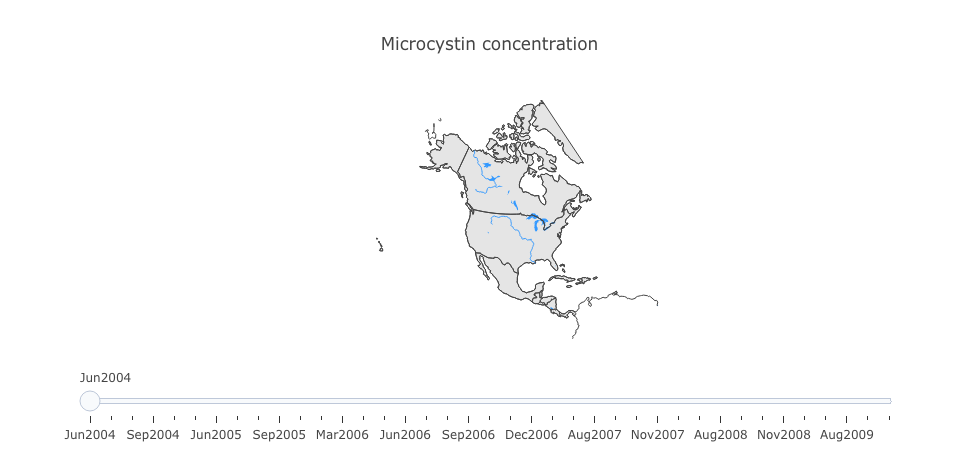

In [30]:
traces = []
steps  = []

year = pd.to_datetime(df['DATETIME']).dt.year
years = range(np.min(year), np.max(year)+1)
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

################ Add info about traces
for y in years:
    for m in range(len(months)):
        time_data = df[(month == m) & (year == y)]
        time_data["MC_pc_bin"] = np.log(np.abs(time_data["MC Percent Change"]) + 1)
        traces.append(go.Scattergeo(
                 lon = time_data['LONG'],
                 lat = time_data['LAT'],
                 mode = 'markers',
                 text = df['MC Percent Change'],
                 visible = False,
                 #name = "MC > WHO Limit",
                marker = dict(
                    size = 6,
                    reversescale = True,
                    autocolorscale = False,
                    symbol = 'circle',
                    opacity = 0.6,
                    line = dict(
                        width=1,
                        color='rgba(102, 102, 102)'
                    ),
                    colorscale = 'Viridis' ,
                    cmin = 0,
                    color = time_data['MC_pc_bin'],
                    cmax = time_data['MC_pc_bin'].max(),
                    colorbar=dict(
                        title="Log Microcystin Concentration Change %")
                )))

######### Slider logic
steps  = []
for i in range(len(years)):
    for j in range(12):
        trace_indx = i*12 + j
        if len(traces[trace_indx].lon) == 0: 
            continue
        step = dict(
            method = 'restyle',  
            args = ['visible', [False] * len(traces)],
            label= months[j] + str(years[i]))
        step['args'][1][trace_indx] = True
        
        steps.append(step)
    
sliders = [dict(
    active = 0,
    steps=steps
)]

layout = go.Layout(title='Microcystin concentration',
                   showlegend=False,
                   sliders = sliders,
                       geo = dict(
                            scope='north america',
                            showframe = False,
                            showcoastlines = True,
                            showlakes = True,
                            showland = True,
                            landcolor = "rgb(229, 229, 229)",
                            showrivers = True
                        ))

fig = go.Figure(layout=layout, data=traces)    
plotly.offline.iplot(fig, validate=False)